In [1]:
#Import external packages
import matplotlib.pyplot as plt
import numpy as np
import time
import pandas as pd
import seaborn as sns


from scipy.integrate import odeint as ode
from scipy.optimize import minimize
from scipy.optimize import Bounds

In [3]:
#Import local functions
sys.path.append('../functions')
from functions import dual_control_scipy, loss_biological, upstream_repression_scipy, downstream_activation_scipy

In [4]:
def solve_point(x, function=dual_control_scipy):
    n1, n2, theta1, theta2, k1, k2 = x
    pred = ode(function, y0, t, args=(n1, n2, theta1, theta2, k1, k2))
    j1, j2, loss = loss_biological(pred, alpha1=alpha1, alpha2=alpha2)
    return j1, j2, loss

In [5]:
#Establish hyperparameters
alpha1 = 1E-5
alpha2 = 1E-2

int_time = 5E4
t = np.linspace(0, int_time, 100) 
y0 = np.array([2290., 0., 0., 0., 0., 0.]) 

In [11]:
results = pd.DataFrame(columns=['n1', 'n2', 'theta1', 'theta2', 'k1', 'k2', 'elapsed_time', 'j1', 'j2', 'loss'])

In [14]:
ns = [1, 2, 3, 4]
ks = np.linspace(1E-7, 0.001, 10)
thetas = np.linspace(0.001, 100, 10)

for n1 in ns:
    for n2 in ns:
        for k1 in ks:
            for k2 in ks:
                for theta1 in thetas:
                    for theta2 in thetas:
                        start_time = time.time()
                        j1, j2, loss = solve_point([n1, n2, theta1, theta2, k1, k2])
                        elapsed_time = time.time()-start_time
                        row = [n1, n2, theta1, theta2, k1, k2, elapsed_time, j1, j2, loss]
                        results.loc[len(results)] = row


/Users/charlotte/opt/anaconda3/envs/thesis/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/Users/charlotte/opt/anaconda3/envs/thesis/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/Users/charlotte/opt/anaconda3/envs/thesis/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun type). Run with full_output = 1 to get quantitative information.
  warnings.warn(warning_msg, ODEintWarning)
/Users/charlotte/opt/anaconda3/envs/thesis/lib/python3.9/site-packages/scipy/integrate/odepack.py:247: ODEintWarning: Excess work done on this call (perhaps wrong Dfun t

In [16]:
results.to_csv('6d_landscape.csv')

In [23]:
results.loc[results.n1 == 1].loc[results.n2 == 1].loc[results.theta1 == 0.001].loc[results.theta2 == 0.001]

,n1,n2,theta1,theta2,k1,k2,elapsed_time,j1,j2,loss
0,1.0,1.0,0.001,0.001,1.000000e-07,1.000000e-07,0.003208,49995.034823,0.005000,0.500000
1,1.0,1.0,0.001,0.001,1.000000e-07,1.000000e-07,0.003176,49995.034823,0.005000,0.500000
101,1.0,1.0,0.001,0.001,1.000000e-07,1.112000e-04,0.005987,49861.131613,4.168206,0.540293
201,1.0,1.0,0.001,0.001,1.000000e-07,2.223000e-04,0.004722,49822.126414,7.549504,0.573716
301,1.0,1.0,0.001,0.001,1.000000e-07,3.334000e-04,0.005795,49796.836578,10.560936,0.603578
...,...,...,...,...,...,...,...,...,...,...
9501,1.0,1.0,0.001,0.001,1.000000e-03,5.556000e-04,0.008024,18384.537031,27.946923,0.463315
9601,1.0,1.0,0.001,0.001,1.000000e-03,6.667000e-04,0.009432,16605.760200,33.474100,0.500799
9701,1.0,1.0,0.001,0.001,1.000000e-03,7.778000e-04,0.019679,15193.611243,38.991821,0.541854
9801,1.0,1.0,0.001,0.001,1.000000e-03,8.889000e-04,0.011213,14029.891474,44.500350,0.585302


<AxesSubplot:xlabel='loss', ylabel='Density'>

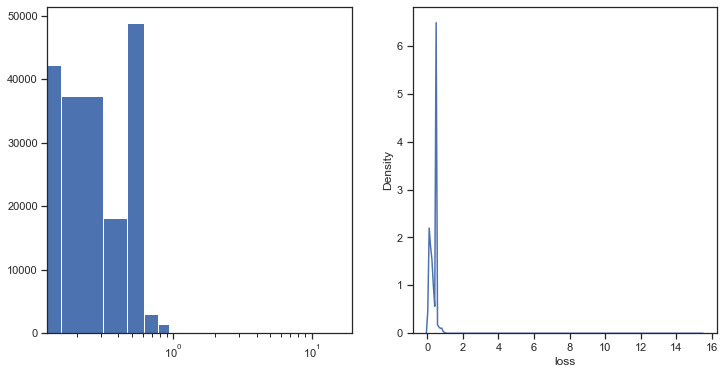

In [149]:
pos_losses = results.loc[results.loss >= 0]
small_losses = pos_losses.loc[pos_losses.loss <= 1E100]



#plt.plot(small_losses.loss, small_losses.elapsed_time, '.')
fig, axs = plt.subplots(1, 2, figsize=(12, 6))
ax = axs[0]
ax.hist(small_losses.loss, bins=100)
ax.set_xscale('log')

ax = axs[1]
sns.kdeplot(small_losses.loss, ax=ax)


In [63]:
big_losses = results.loc[results.loss >= 1E2]
print('Number of very large losses: ', len(big_losses))

neg_losses = results.loc[results.loss < 0]
print('Number of negative losses: ', len(neg_losses))

Number of very large losses:  5434
Number of negative losses:  569


Text(0, 0.5, '$k_2$')

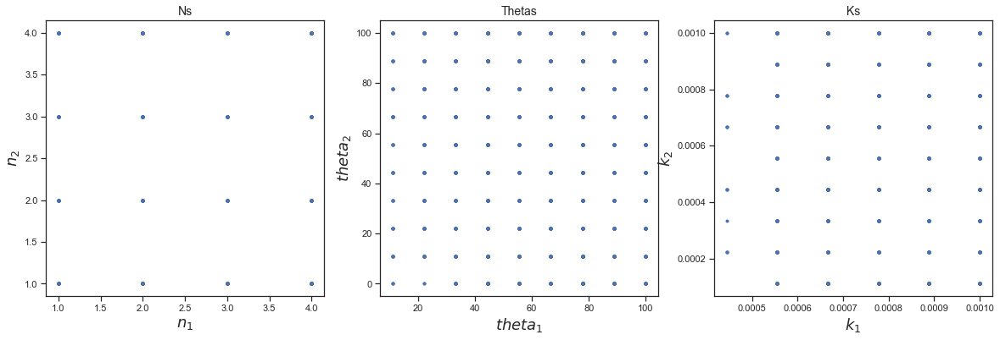

In [91]:
plot_data = big_losses

fig, axs = plt.subplots(1, 3, figsize=(20, 6))

endpoint = 'Ns'
ax = axs[0]
ax.plot(plot_data.n1, plot_data.n2, '.')

ax.set_title(f'{endpoint}', fontsize=14)
ax.set_xlabel('$n_1$', fontsize=18)
ax.set_ylabel('$n_2$', fontsize=18)

endpoint = 'Thetas'
ax = axs[1]
ax.plot(plot_data.theta1, plot_data.theta2, '.')

ax.set_title(f'{endpoint}', fontsize=14)
ax.set_xlabel('$theta_1$', fontsize=18)
ax.set_ylabel('$theta_2$', fontsize=18)

endpoint = 'Ks'
ax = axs[2]
ax.plot(plot_data.k1, plot_data.k2, '.')

ax.set_title(f'{endpoint}', fontsize=14)
ax.set_xlabel('$k_1$', fontsize=18)
ax.set_ylabel('$k_2$', fontsize=18)

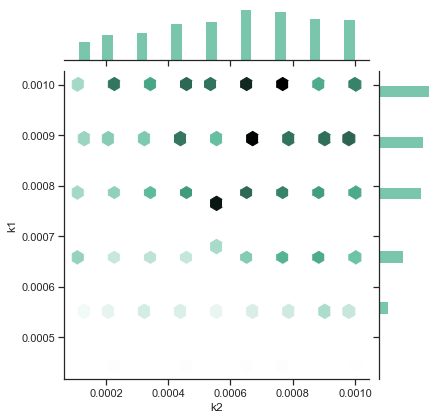

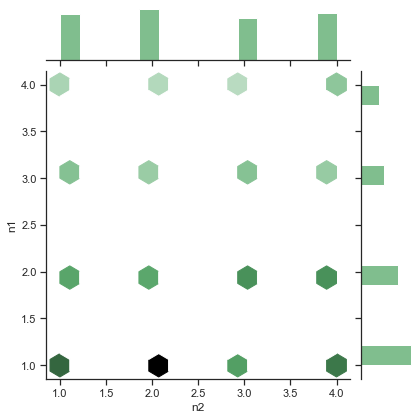

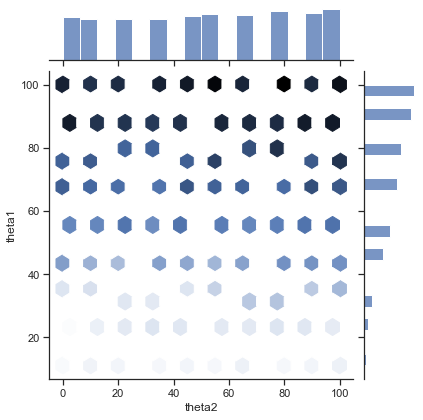

In [92]:
plot_data = big_losses

sns.jointplot( y="k1", x= "k2", data=plot_data,  kind="hex",color="#4CB391")
sns.jointplot( y="n1", x= "n2", data=plot_data,  kind="hex",color="g")
sns.jointplot( y="theta1", x= "theta2", data=plot_data,  kind="hex",color="b")


In [104]:
#Try to regenerate individual numerical errors
test_point = [1, 1, 77.78, 66.67, 0.000556, 0.000222]
solve_point(test_point)

(0.9124805477746654, 1.0, 0.010009124805477746)

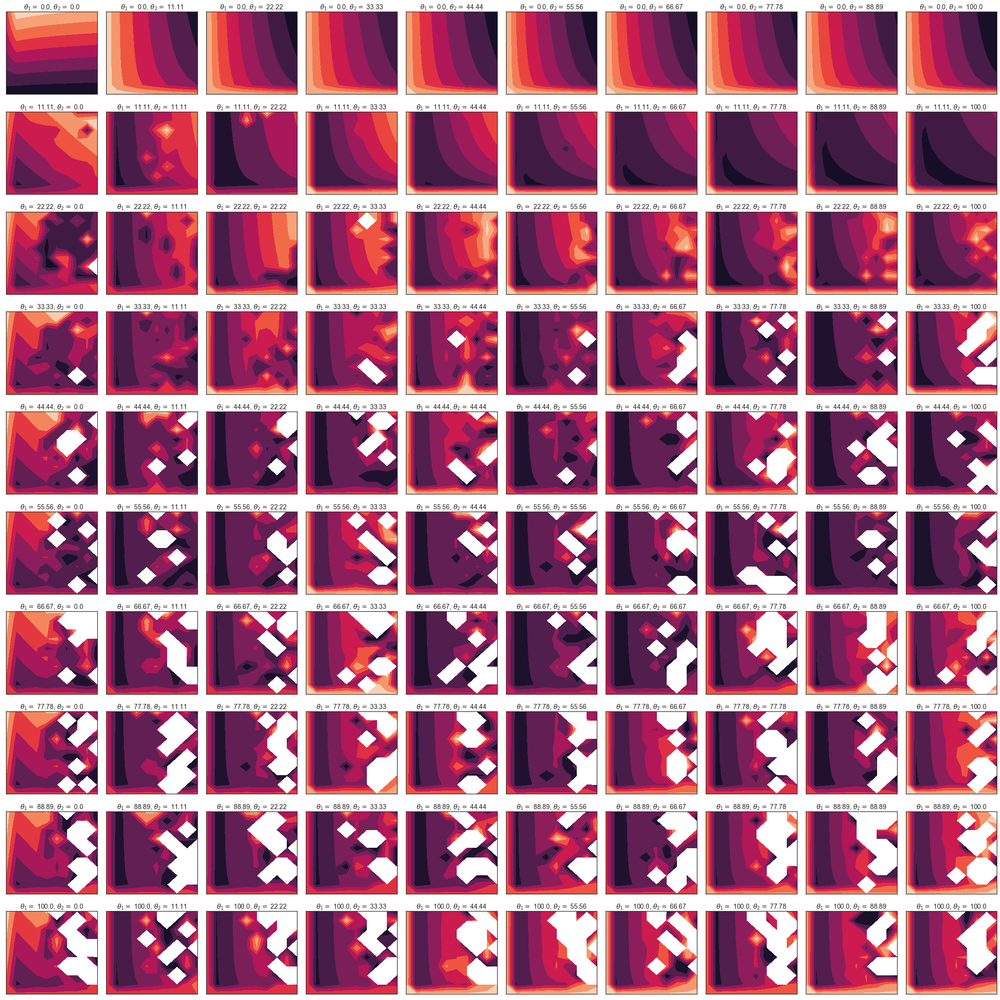

In [131]:
#Try to regenerate plots from solvers
nnoerrors = results.loc[results.loss < 1E2].loc[results.loss >= 0]
doubles = nnoerrors.loc[nnoerrors.n1 == 2].loc[nnoerrors.n2 == 2]

fig, axs = plt.subplots(10, 10, figsize=(30,30))

for i in range(10):
    for j in range(10):
        ax = axs[i][j]
        theta1 = thetas[i]
        theta2 = thetas[j]
        d = doubles.loc[doubles.theta1 == theta1].loc[doubles.theta2 ==theta2]
        k1_unique = np.sort(d.k1.unique())
        k2_unique = np.sort(d.k2.unique())
        k1s, k2s = np.meshgrid(k1_unique, k2_unique)
        loss = d.pivot_table(index='k1', columns='k2', values='loss').T.values
        contour = ax.contourf(k1s,k2s,loss)
        ax.set_title(rf'$\theta_1 = $ {round(theta1, 2)}, $\theta_2 = $ {round(theta2, 2)}', fontsize=14)
        ax.set_xticks([])
        ax.set_yticks([])
        #fig.colorbar(contour, ax=ax)

fig.tight_layout()

In [157]:
#Examine normal losses only for convexity and find normal minimum loss
noerrors = small_losses.loc[small_losses.loss > 1E-100]
noerrors.loc[noerrors.loss == noerrors.loss.min()]

,n1,n2,theta1,theta2,k1,k2,elapsed_time,j1,j2,loss
6578,1.0,1.0,77.778,77.778,0.000667,0.000556,0.015927,2.054695e-81,2.054695e-81,2.056750e-83
6579,1.0,1.0,77.778,88.889,0.000667,0.000556,0.015314,2.054695e-81,2.054695e-81,2.056750e-83
6823,1.0,1.0,22.223,22.223,0.000667,0.000889,0.018799,2.054695e-81,2.054695e-81,2.056750e-83
6935,1.0,1.0,33.334,44.445,0.000667,0.001000,0.017494,2.054695e-81,2.054695e-81,2.056750e-83
6937,1.0,1.0,33.334,66.667,0.000667,0.001000,0.016470,2.054695e-81,2.054695e-81,2.056750e-83
6938,1.0,1.0,33.334,77.778,0.000667,0.001000,0.015770,2.054695e-81,2.054695e-81,2.056750e-83
6939,1.0,1.0,33.334,88.889,0.000667,0.001000,0.015049,2.054695e-81,2.054695e-81,2.056750e-83
7339,1.0,1.0,33.334,88.889,0.000778,0.000333,0.016889,2.054695e-81,2.054695e-81,2.056750e-83


In [162]:
noerrors.n1.unique()

array([1., 2., 3., 4.])

In [172]:
noerrors.loc[noerrors.n1 == 1.].loc[noerrors.n2 == 1.].loc[noerrors.theta1 == 0.001].loc[noerrors.theta2 == 0.001].loss.min()

0.49955300254612284